# Setup

## Install Detectron2

In [1]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
# !git clone 'https://github.com/facebookresearch/detectron2'
# dist = distutils.core.run_setup("./detectron2/setup.py")
# !python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
# sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 274 kB 6.2 MB/s eta 0:00:01
  Created wheel for pyyaml: filename=PyYAML-5.1-cp38-cp38-linux_x86_64.whl size=44074 sha256=2e99655f36b7c6c9d793773ea549adb68cbe6515fd4a9ade21180d4b6917946e
  Stored in directory: /home/shabanza/.cache/pip/wheels/52/dd/2b/10ff8b0ac81b93946bb5fb9e6749bae2dac246506c8774e6cf
Successfully built pyyaml
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.7.0 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Defaulting to user installation because normal site-packages is not writeable
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-x8w82efd
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-x8w82efd
     |████████

In [1]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Mon_May__3_19:15:13_PDT_2021
Cuda compilation tools, release 11.3, V11.3.109
Build cuda_11.3.r11.3/compiler.29920130_0
torch:  1.10 ; cuda:  cu113
detectron2: 0.6


## Install Mask2Former

In [2]:
# clone and install Mask2Former
# !git clone https://github.com/facebookresearch/Mask2Former.git
%cd Mask2Former
%pip install -U opencv-python
# %pip install git+https://github.com/cocodataset/panopticapi.git
%pip install -r requirements.txt
%cd mask2former/modeling/pixel_decoder/ops
!python setup.py build install

/scratch/shabanza/segmentation/Mask2Former
Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 61.7 MB 6.0 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 2.3 MB 6.1 MB/s eta 0:00:01
     |████████████████████████████████| 2.2 MB 108.1 MB/s eta 0:00:01
     |████████████████████████████████| 73 kB 8.1 MB/s s eta 0:00:01
     |████████████████████████████████| 1.3 MB 78.4 MB/s eta 0:00:01
     |████████████████████████████████| 268 kB 96.3 MB/s eta 0:00:01
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  NOTE: The current PATH contains path(s) starting with `~`, which may not be expanded by all applications.
Note: you may need to restart the kernel to use updated packages.
/scratch/shabanza/segmentation/

In [3]:
%cd /scratch/shabanza/segmentation/Mask2Former
%cd mask2former/modeling/pixel_decoder/ops
!sudo sh make.sh
%cd /scratch/shabanza/segmentation/Mask2Former

/scratch/shabanza/segmentation/Mask2Former
/scratch/shabanza/segmentation/Mask2Former/mask2former/modeling/pixel_decoder/ops
running build
running build_py
running build_ext
building 'MultiScaleDeformableAttention' extension
Emitting ninja build file /scratch/shabanza/segmentation/Mask2Former/mask2former/modeling/pixel_decoder/ops/build/temp.linux-x86_64-3.8/build.ninja...
Compiling objects...
Allowing ninja to set a default number of workers... (overridable by setting the environment variable MAX_JOBS=N)
ninja: no work to do.
g++ -pthread -shared -B /opt/conda/compiler_compat -L/opt/conda/lib -Wl,-rpath=/opt/conda/lib -Wl,--no-as-needed -Wl,--sysroot=/ /scratch/shabanza/segmentation/Mask2Former/mask2former/modeling/pixel_decoder/ops/build/temp.linux-x86_64-3.8/scratch/shabanza/segmentation/Mask2Former/mask2former/modeling/pixel_decoder/ops/src/vision.o /scratch/shabanza/segmentation/Mask2Former/mask2former/modeling/pixel_decoder/ops/build/temp.linux-x86_64-3.8/scratch/shabanza/segment

For gccxx not found error:
> sudo apt-get update && sudo apt-get install software-properties-common && sudo add-apt-repository ppa:ubuntu-toolchain-r/test && sudo apt-get upgrade libstdc++6

For libGL error:
> sudo apt-get install ffmpeg libsm6 libxext6  -y

## Imports

In [1]:
# import some common libraries
import torch
import matplotlib.pyplot as plt

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
torch.cuda.empty_cache()

In [4]:
# You may need to restart your runtime prior to this, to let your installation take effect
# %cd Mask2Former
# Some basic setup:
# Setup detectron2 logger
from detectron2.utils.logger import setup_logger
setup_logger()
setup_logger(name="mask2former")


# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog
coco_metadata = MetadataCatalog.get("coco_2017_val_panoptic")

# Dataset

In [5]:
from detectron2.data import DatasetCatalog, MetadataCatalog
from src.dataset.register_comic_instance import *

registering comic ...
loading sinergia json ...
Sinergia Json loaded.
registering placid ...


100%|██████████| 47256/47256 [00:00<00:00, 647994.71it/s]


registering yves ...


100%|██████████| 47256/47256 [00:00<00:00, 713245.85it/s]


In [6]:
dataset_name = DATASET_NAME

dataset_dicts = DatasetCatalog.get(dataset_name)
metadata = MetadataCatalog.get(dataset_name)

[09/22 13:23:24 d2.data.datasets.coco]: Loading /sinergia/shabanza/datasets/sinergia/coco/annotations/instances_default_modified.json takes 1.40 seconds.
[09/22 13:23:24 d2.data.datasets.coco]: Loaded 282 images in COCO format from /sinergia/shabanza/datasets/sinergia/coco/annotations/instances_default_modified.json


In [7]:
placid_dataset_dicts = DatasetCatalog.get(PLACID_NAME)
placid_metadata = MetadataCatalog.get(PLACID_NAME)

[09/22 13:23:25 d2.data.datasets.coco]: Loaded 154 images in COCO format from /sinergia/shabanza/datasets/sinergia/coco/annotations/instances_placid.json


In [8]:
yves_dataset_dicts = DatasetCatalog.get(YVES_NAME)
yves_metadata = MetadataCatalog.get(YVES_NAME)

[09/22 13:23:25 d2.data.datasets.coco]: Loaded 128 images in COCO format from /sinergia/shabanza/datasets/sinergia/coco/annotations/instances_yves.json


# DeepLab

In [ ]:
# %cd detectron2/projects/DeepLab
# !python train_net.py --config-file configs/Cityscapes-SemanticSegmentation/deeplab_v3_plus_R_103_os16_mg124_poly_90k_bs16.yaml --num-gpus 8

# Finetune

In [9]:
from src.evaluation.instance_evaluation import *
from src.evaluation.semantic_evaluation import *
from src.evaluation.helpers import *
from src.dataset.register_train_test import *
from src.dataset.helpers import *
from src.train.config import *
from src.train.deeplab_trainer import *

## Placid

In [10]:
import warnings
warnings.filterwarnings('ignore')

In [11]:
class Args:
    def __init__(self) -> None:
        self.lr = 1e-4
        self.num_gpus = 2
        self.test_size = 0.2
        self.random_state = 42
        self.eval_type = EvalType.COMIC_SEM_SEG.value
        self.data_mode = 'placid'
        self.fn_mode = 'predictor'
        self.batch_size = 16
        self.cropped = True
        self.epochs = 10
        self.keep_class_ids = [24, 25, 26, 27]
        self.config_file = 'detectron2/projects/DeepLab/configs/Cityscapes-SemanticSegmentation/deeplab_v3_plus_R_103_os16_mg124_poly_90k_bs16.yaml'
        self.opts = ['SOLVER.CHECKPOINT_PERIOD', '1000',
                'MODEL.WEIGHTS', 'https://dl.fbaipublicfiles.com/detectron2/DeepLab/Cityscapes-SemanticSegmentation/deeplab_v3_plus_R_103_os16_mg124_poly_90k_bs16/28054032/model_final_a8a355.pkl', 
                'OUTPUT_DIR', '/sinergia/shabanza/outputs/deeplab']

args = Args()
cfg = deeplab_setup(args)

sinergia_placid_instances
registering train test dataset ...
[09/22 13:23:29 d2.data.datasets.coco]: Loading /sinergia/shabanza/datasets/sinergia/coco/annotations/instances_placid.json takes 1.13 seconds.
[09/22 13:23:29 d2.data.datasets.coco]: Loaded 154 images in COCO format from /sinergia/shabanza/datasets/sinergia/coco/annotations/instances_placid.json
sinergia_placid_instances_train 123
Collect all panels for mode train ...


100%|██████████| 2/2 [00:05<00:00,  2.96s/it]


sinergia_placid_instances_test 31
Collect all panels for mode test ...


100%|██████████| 2/2 [00:07<00:00,  3.83s/it]

dataset train name:  sinergia_placid_instances_train_cropped
LR is:  0.0001
MAX ITER is:  7
STEPS is:  (60000, 80000)


In [12]:
trainer = DeepLabComicTrainer(cfg)
# trainer.resume_or_load(resume=False)
# trainer.train()

# if args.wandb:
# histories = trainer.storage.histories()


[09/22 13:23:50 d2.engine.defaults]: Model:
SemanticSegmentor(
  (backbone): ResNet(
    (stem): DeepLabStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False
        (norm): SyncBatchNorm(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (conv2): Conv2d(
        64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
        (norm): SyncBatchNorm(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (conv3): Conv2d(
        64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
        (norm): SyncBatchNorm(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): SyncBatchNorm(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
     

In [13]:
cfg.KEEP_CLASS_IDS = None
data_loader = DeepLabComicTrainer.build_train_loader(cfg)

[09/22 13:23:55 d2.data.build]: Removed 0 images with no usable annotations. 25 images left.
[09/22 13:23:55 d2.data.build]: Using training sampler TrainingSampler
[09/22 13:23:55 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[09/22 13:23:55 d2.data.common]: Serializing 25 elements to byte tensors and concatenating them all ...
[09/22 13:23:55 d2.data.common]: Serialized dataset takes 8.14 MiB


In [21]:
dataset_dicts = DatasetCatalog.get('sinergia_placid_instances_train_cropped')

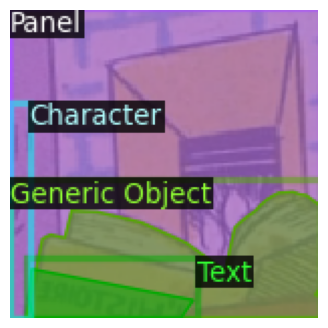

In [16]:
plt.figure(figsize=(4, 4))
plt.axis('off')
plt.imshow(r)

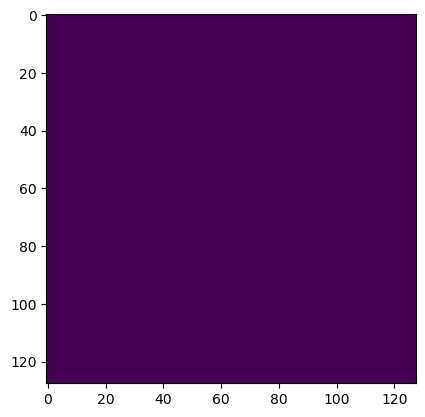

In [42]:
plt.imshow(batch[1]['sem_seg'][4].numpy())

In [27]:
from detectron2.structures import BitMasks

In [34]:
instances = batch[1]['instances']
segmentation_masks = instances.gt_masks
class_labels = instances.gt_classes
image_height, image_width = batch[1]['height'], batch[1]['width']
bitmasks = BitMasks.from_polygon_masks(segmentation_masks, image_width, image_height)
sem_seg = bitmasks.tensor.numpy()

for l in class_labels:
    sem_seg = np.where(sem_seg, sem_seg, l)

In [33]:
sem_seg

array([[[27, 27, 27, ..., 27, 27, 27],
        [27, 27, 27, ..., 27, 27, 27],
        [27, 27, 27, ..., 27, 27, 27],
        ...,
        [27, 27, 27, ..., 27, 27, 27],
        [27, 27, 27, ..., 27, 27, 27],
        [27, 27, 27, ..., 27, 27, 27]],

       [[27, 27, 27, ..., 27, 27, 27],
        [27, 27, 27, ..., 27, 27, 27],
        [27, 27, 27, ..., 27, 27, 27],
        ...,
        [27, 27, 27, ...,  1,  1,  1],
        [27, 27, 27, ...,  1,  1,  1],
        [27, 27, 27, ...,  1,  1,  1]],

       [[27, 27, 27, ..., 27, 27, 27],
        [27, 27, 27, ..., 27, 27, 27],
        [27, 27, 27, ..., 27, 27, 27],
        ...,
        [27, 27, 27, ..., 27, 27, 27],
        [27, 27, 27, ..., 27, 27, 27],
        [27, 27, 27, ..., 27, 27, 27]],

       [[ 1,  1,  1, ...,  1,  1,  1],
        [ 1,  1,  1, ...,  1,  1,  1],
        [ 1,  1,  1, ...,  1,  1,  1],
        ...,
        [ 1,  1,  1, ...,  1,  1,  1],
        [ 1,  1,  1, ...,  1,  1,  1],
        [ 1,  1,  1, ...,  1,  1,  1]]])

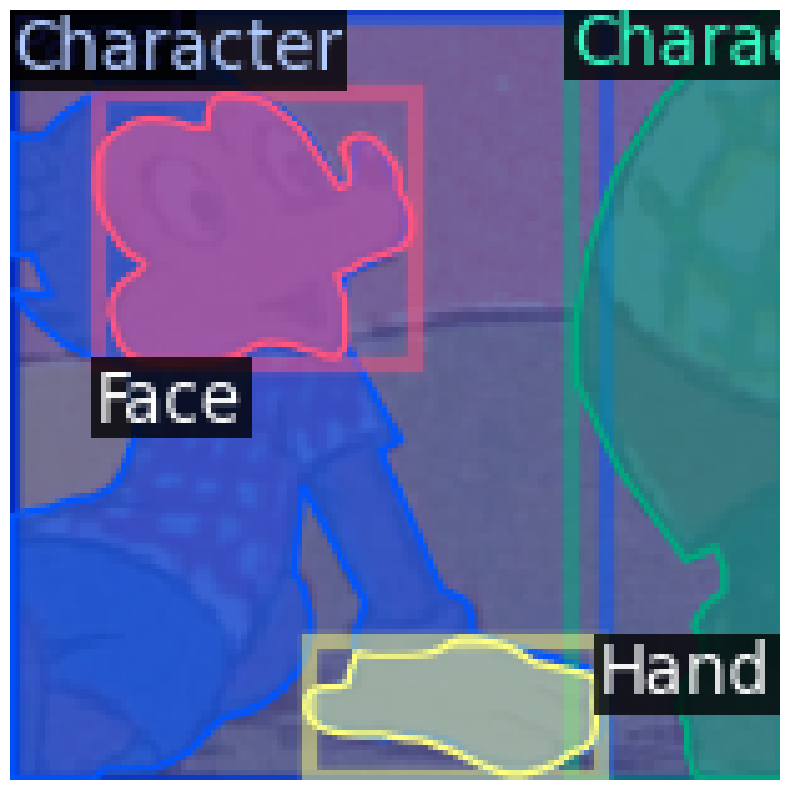

In [35]:
# batch = next(iter(data_loader))
im = batch[1]['image'].cpu().numpy().transpose((1, 2, 0))
v = Visualizer(im, placid_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
r = v.draw_dataset_dict(batch[1]).get_image()
plt.figure(figsize=(10, 10))
plt.axis('off')
plt.imshow(r)

In [14]:
# cfg.MODEL.WEIGHTS = '/home/yalda/IVRL_backup/shabanza_sinergia/outputs/model_final.pth'
predictor = ComicPredictor(cfg)

[09/06 15:57:55 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/maskformer/mask2former/coco/instance/maskformer2_swin_large_IN21k_384_bs16_100ep/model_final_e5f453.pkl ...


Weight format of MultiScaleMaskedTransformerDecoder have changed! Please upgrade your models. Applying automatic conversion now ...
Skip loading parameter 'sem_seg_head.predictor.class_embed.weight' to the model due to incompatible shapes: (81, 256) in the checkpoint but (29, 256) in the model! You might want to double check if this is expected.
Skip loading parameter 'sem_seg_head.predictor.class_embed.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (29,) in the model! You might want to double check if this is expected.
Skip loading parameter 'criterion.empty_weight' to the model due to incompatible shapes: (81,) in the checkpoint but (29,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
criterion.empty_weight
sem_seg_head.predictor.class_embed.{bias, weight}


In [16]:
index = 1

In [17]:
im = batch[index]['image'].cpu().numpy().transpose((1, 2, 0))
pred_output = predictor(im)

NameError: name 'batch' is not defined

In [32]:
comic_metadata = MetadataCatalog.get(dataset_train_name)
comic_metadata.stuff_classes = []

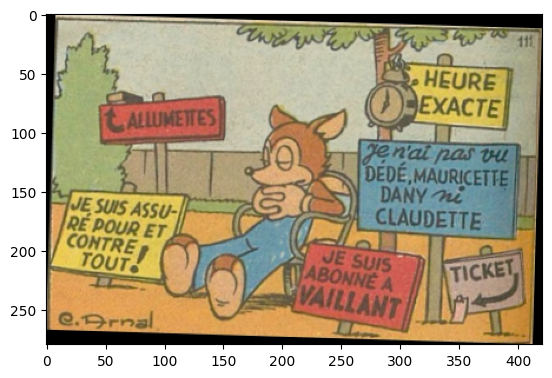

Panoptic segmentation (top), instance segmentation (middle), semantic segmentation (bottom)


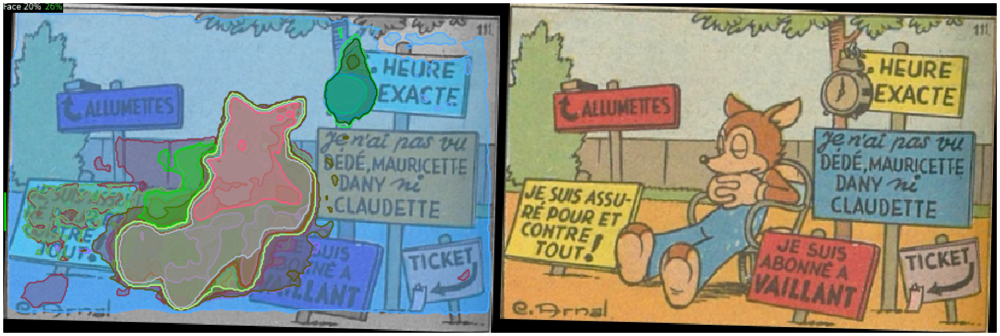

In [35]:
from src.dataset.helpers import *

im = batch[index]['image'].cpu().numpy().transpose((1, 2, 0))
plt.imshow(im)
plt.show()
v = Visualizer(im[:, :, ::-1], comic_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
instance_result = v.draw_instance_predictions(pred_output["instances"].to("cpu")).get_image()
v = Visualizer(im, comic_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
semantic_result = v.draw_sem_seg(pred_output["sem_seg"].argmax(0).to("cpu")).get_image()
print("Panoptic segmentation (top), instance segmentation (middle), semantic segmentation (bottom)")
res = np.concatenate((instance_result, semantic_result), axis=1)
plt.figure(figsize=(40, 30))
plt.imshow(res)
plt.axis('off')
plt.show()

In [23]:
import wandb

wandb.init(
    project="comic-seg",
    config={
        "panel_wise": True,
        "dataset": 'placid',
    },
    name='batch2_fn_class_embed'
)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


wandb: Currently logged in as: yaldashbz. Use `wandb login --relogin` to force relogin


In [24]:
from src.train.plain_train_net import do_train

model = predictor.model
do_train(cfg, model, resume=False, distributed=False, data_loader=data_loader)

relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
relative_position_bias_table
[09/05 10:44:35 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/maskformer/mask2former/coco/instance/maskformer2_swin_large_IN21k_384_bs16_100ep/model_final_e5f453.pkl ...


Weight format of MultiScaleMaskedTransformerDecoder have changed! Please upgrade your models. Applying automatic conversion now ...
Skip loading parameter 'sem_seg_head.predictor.class_embed.weight' to the model due to incompatible shapes: (81, 256) in the checkpoint but (29, 256) in the model! You might want to double check if this is expected.
Skip loading parameter 'sem_seg_head.predictor.class_embed.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (29,) in the model! You might want to double check if this is expected.
Skip loading parameter 'criterion.empty_weight' to the model due to incompatible shapes: (81,) in the checkpoint but (29,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
criterion.empty_weight
sem_seg_head.predictor.class_embed.{bias, weight}


[09/05 10:44:36 detectron2]: Starting training from iteration 0


19it [00:13,  1.50it/s]

[09/05 10:44:50 d2.utils.events]:  iter: 19  total_loss: 100.9  loss_ce: 7.325  loss_mask: 0.06366  loss_dice: 3.439  loss_ce_0: 6.074  loss_mask_0: 0.004732  loss_dice_0: 0.5153  loss_ce_1: 7.786  loss_mask_1: 0.006195  loss_dice_1: 0.6971  loss_ce_2: 8.176  loss_mask_2: 0.01663  loss_dice_2: 2.102  loss_ce_3: 7.688  loss_mask_3: 0.04805  loss_dice_3: 3.045  loss_ce_4: 7.296  loss_mask_4: 0.04151  loss_dice_4: 3.246  loss_ce_5: 7.181  loss_mask_5: 0.07512  loss_dice_5: 3.343  loss_ce_6: 7.565  loss_mask_6: 0.08628  loss_dice_6: 3.315  loss_ce_7: 7.344  loss_mask_7: 0.04835  loss_dice_7: 3.164  loss_ce_8: 7.379  loss_mask_8: 0.05553  loss_dice_8: 3.353     lr: 2.5e-05  max_mem: 21637M


2023-09-05 10:44:51.089070: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-05 10:44:51.725005: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
39it [00:28,  1.94it/s]

[09/05 10:45:04 d2.utils.events]:  eta: 6 days, 2:05:23  iter: 39  total_loss: 101.1  loss_ce: 7.466  loss_mask: 0.1108  loss_dice: 3.449  loss_ce_0: 6.109  loss_mask_0: 0.004735  loss_dice_0: 0.5433  loss_ce_1: 7.866  loss_mask_1: 0.006716  loss_dice_1: 0.6757  loss_ce_2: 8.135  loss_mask_2: 0.01885  loss_dice_2: 2.228  loss_ce_3: 7.615  loss_mask_3: 0.06087  loss_dice_3: 3.181  loss_ce_4: 7.278  loss_mask_4: 0.05025  loss_dice_4: 3.225  loss_ce_5: 7.286  loss_mask_5: 0.05792  loss_dice_5: 3.414  loss_ce_6: 7.501  loss_mask_6: 0.08975  loss_dice_6: 3.216  loss_ce_7: 7.559  loss_mask_7: 0.05702  loss_dice_7: 2.976  loss_ce_8: 7.547  loss_mask_8: 0.09692  loss_dice_8: 3.331     lr: 2.5e-05  max_mem: 21637M


59it [00:39,  1.61it/s]

[09/05 10:45:16 d2.utils.events]:  eta: 4 days, 19:42:41  iter: 59  total_loss: 104  loss_ce: 7.335  loss_mask: 0.1237  loss_dice: 3.764  loss_ce_0: 6.142  loss_mask_0: 0.004181  loss_dice_0: 0.5217  loss_ce_1: 7.88  loss_mask_1: 0.005777  loss_dice_1: 0.737  loss_ce_2: 8.129  loss_mask_2: 0.02455  loss_dice_2: 3.362  loss_ce_3: 7.712  loss_mask_3: 0.06062  loss_dice_3: 3.539  loss_ce_4: 7.431  loss_mask_4: 0.077  loss_dice_4: 3.664  loss_ce_5: 7.343  loss_mask_5: 0.0685  loss_dice_5: 3.494  loss_ce_6: 7.513  loss_mask_6: 0.1031  loss_dice_6: 3.586  loss_ce_7: 7.427  loss_mask_7: 0.0794  loss_dice_7: 3.38  loss_ce_8: 7.52  loss_mask_8: 0.1071  loss_dice_8: 3.577     lr: 2.5e-05  max_mem: 21637M


79it [00:49,  2.37it/s]

[09/05 10:45:26 d2.utils.events]:  eta: 4 days, 11:16:37  iter: 79  total_loss: 103.5  loss_ce: 7.349  loss_mask: 0.1164  loss_dice: 3.536  loss_ce_0: 6.069  loss_mask_0: 0.007503  loss_dice_0: 0.4922  loss_ce_1: 7.782  loss_mask_1: 0.007512  loss_dice_1: 0.8588  loss_ce_2: 8.123  loss_mask_2: 0.02604  loss_dice_2: 2.864  loss_ce_3: 7.649  loss_mask_3: 0.0956  loss_dice_3: 3.434  loss_ce_4: 7.239  loss_mask_4: 0.1067  loss_dice_4: 3.839  loss_ce_5: 7.186  loss_mask_5: 0.09774  loss_dice_5: 3.585  loss_ce_6: 7.416  loss_mask_6: 0.1253  loss_dice_6: 3.515  loss_ce_7: 7.44  loss_mask_7: 0.1014  loss_dice_7: 3.394  loss_ce_8: 7.566  loss_mask_8: 0.1139  loss_dice_8: 3.501     lr: 2.5e-05  max_mem: 21637M


99it [01:00,  1.71it/s]

[09/05 10:45:36 d2.utils.events]:  eta: 4 days, 10:24:59  iter: 99  total_loss: 102.4  loss_ce: 7.251  loss_mask: 0.09771  loss_dice: 3.769  loss_ce_0: 6.117  loss_mask_0: 0.005239  loss_dice_0: 0.5009  loss_ce_1: 7.853  loss_mask_1: 0.006778  loss_dice_1: 0.7812  loss_ce_2: 7.99  loss_mask_2: 0.01768  loss_dice_2: 2.587  loss_ce_3: 7.595  loss_mask_3: 0.08296  loss_dice_3: 3.312  loss_ce_4: 7.273  loss_mask_4: 0.08295  loss_dice_4: 3.601  loss_ce_5: 7.076  loss_mask_5: 0.09778  loss_dice_5: 3.544  loss_ce_6: 7.313  loss_mask_6: 0.09676  loss_dice_6: 3.616  loss_ce_7: 7.331  loss_mask_7: 0.07407  loss_dice_7: 3.413  loss_ce_8: 7.383  loss_mask_8: 0.1084  loss_dice_8: 3.602     lr: 2.5e-05  max_mem: 21637M


119it [01:09,  2.20it/s]

[09/05 10:45:46 d2.utils.events]:  eta: 3 days, 23:07:09  iter: 119  total_loss: 101.3  loss_ce: 7.417  loss_mask: 0.08728  loss_dice: 3.74  loss_ce_0: 6.178  loss_mask_0: 0.005842  loss_dice_0: 0.5534  loss_ce_1: 7.771  loss_mask_1: 0.007866  loss_dice_1: 0.8038  loss_ce_2: 8.049  loss_mask_2: 0.01876  loss_dice_2: 2.592  loss_ce_3: 7.739  loss_mask_3: 0.0396  loss_dice_3: 3.129  loss_ce_4: 7.326  loss_mask_4: 0.05746  loss_dice_4: 3.634  loss_ce_5: 7.162  loss_mask_5: 0.0646  loss_dice_5: 3.367  loss_ce_6: 7.333  loss_mask_6: 0.07623  loss_dice_6: 3.554  loss_ce_7: 7.347  loss_mask_7: 0.05829  loss_dice_7: 3.414  loss_ce_8: 7.55  loss_mask_8: 0.08478  loss_dice_8: 3.547     lr: 2.5e-05  max_mem: 21637M


139it [01:18,  2.24it/s]

[09/05 10:45:55 d2.utils.events]:  eta: 3 days, 19:59:39  iter: 139  total_loss: 102.3  loss_ce: 7.365  loss_mask: 0.1066  loss_dice: 3.657  loss_ce_0: 6.072  loss_mask_0: 0.007449  loss_dice_0: 0.5559  loss_ce_1: 7.767  loss_mask_1: 0.007823  loss_dice_1: 0.8183  loss_ce_2: 8.029  loss_mask_2: 0.02019  loss_dice_2: 2.928  loss_ce_3: 7.632  loss_mask_3: 0.06382  loss_dice_3: 3.164  loss_ce_4: 7.263  loss_mask_4: 0.06661  loss_dice_4: 3.316  loss_ce_5: 7.124  loss_mask_5: 0.06985  loss_dice_5: 3.503  loss_ce_6: 7.422  loss_mask_6: 0.1097  loss_dice_6: 3.261  loss_ce_7: 7.235  loss_mask_7: 0.07493  loss_dice_7: 3.129  loss_ce_8: 7.437  loss_mask_8: 0.1319  loss_dice_8: 3.528     lr: 2.5e-05  max_mem: 21637M


159it [01:29,  2.03it/s]

[09/05 10:46:05 d2.utils.events]:  eta: 4 days, 12:48:47  iter: 159  total_loss: 104  loss_ce: 7.235  loss_mask: 0.08864  loss_dice: 3.999  loss_ce_0: 6.091  loss_mask_0: 0.005186  loss_dice_0: 0.5303  loss_ce_1: 7.714  loss_mask_1: 0.008597  loss_dice_1: 1.213  loss_ce_2: 7.94  loss_mask_2: 0.02314  loss_dice_2: 2.868  loss_ce_3: 7.575  loss_mask_3: 0.07199  loss_dice_3: 3.652  loss_ce_4: 7.253  loss_mask_4: 0.07903  loss_dice_4: 3.815  loss_ce_5: 7.114  loss_mask_5: 0.06557  loss_dice_5: 3.841  loss_ce_6: 7.31  loss_mask_6: 0.08064  loss_dice_6: 3.799  loss_ce_7: 7.273  loss_mask_7: 0.06626  loss_dice_7: 3.52  loss_ce_8: 7.411  loss_mask_8: 0.07713  loss_dice_8: 3.853     lr: 2.5e-05  max_mem: 21637M


179it [01:39,  1.84it/s]

[09/05 10:46:16 d2.utils.events]:  eta: 4 days, 13:47:52  iter: 179  total_loss: 102.9  loss_ce: 7.236  loss_mask: 0.1083  loss_dice: 3.814  loss_ce_0: 6.173  loss_mask_0: 0.005441  loss_dice_0: 0.5355  loss_ce_1: 7.767  loss_mask_1: 0.007649  loss_dice_1: 0.8629  loss_ce_2: 8.036  loss_mask_2: 0.03371  loss_dice_2: 2.911  loss_ce_3: 7.523  loss_mask_3: 0.08054  loss_dice_3: 3.537  loss_ce_4: 7.194  loss_mask_4: 0.07885  loss_dice_4: 3.823  loss_ce_5: 7.107  loss_mask_5: 0.09156  loss_dice_5: 3.723  loss_ce_6: 7.339  loss_mask_6: 0.1254  loss_dice_6: 3.501  loss_ce_7: 7.272  loss_mask_7: 0.0772  loss_dice_7: 3.211  loss_ce_8: 7.334  loss_mask_8: 0.1188  loss_dice_8: 3.719     lr: 2.5e-05  max_mem: 21637M


185it [01:44,  1.78it/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 172.00 MiB (GPU 0; 23.68 GiB total capacity; 22.26 GiB already allocated; 90.12 MiB free; 22.84 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [24]:
test_loader = ComicTrainer.build_test_loader(cfg, cfg.DATASETS.TEST[0])

[09/06 12:06:56 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[09/06 12:06:56 d2.data.common]: Serializing 31 elements to byte tensors and concatenating them all ...
[09/06 12:06:56 d2.data.common]: Serialized dataset takes 7.59 MiB


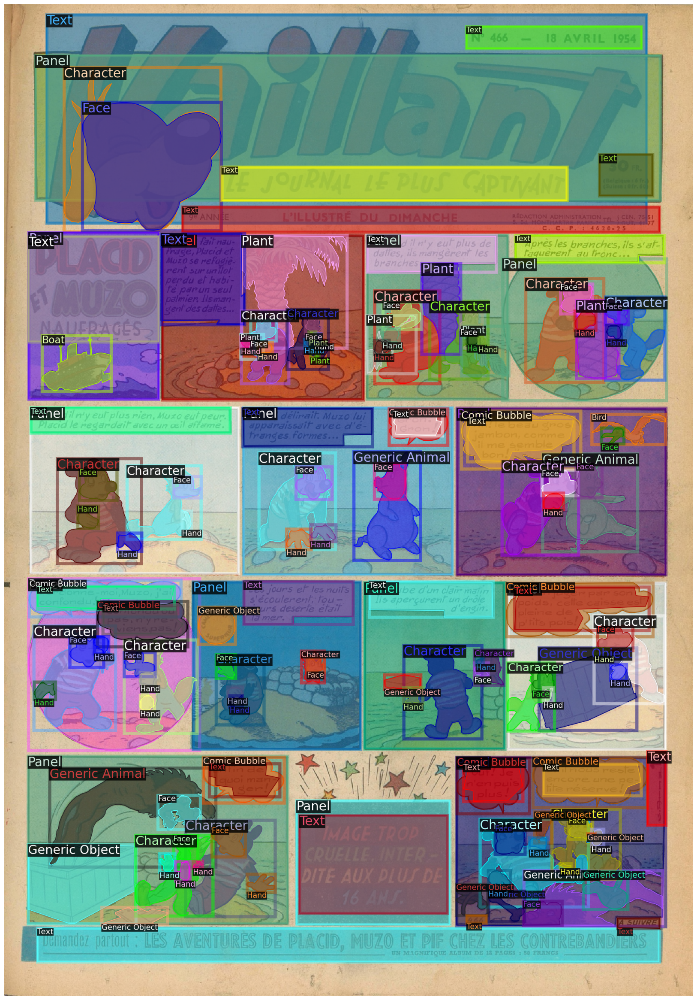

In [28]:
b = next(iter(test_loader))
im = b[0]['image'].cpu().numpy().transpose((1, 2, 0))
v = Visualizer(im, placid_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
r = v.draw_dataset_dict(b[0]).get_image()
plt.figure(figsize=(10, 10))
plt.axis('off')
plt.imshow(r)

In [25]:
b = next(iter(test_loader))

In [26]:
b[0]

{'file_name': '/home/yalda/IVRL_backup/shabanza_sinergia/datasets/sinergia/images/default/placid/Vaillant_0466_1954_04_18-01.png',
 'height': 2296,
 'width': 1597,
 'image_id': 144,
 'annotations': [{'iscrowd': 0,
   'bbox': array([1216.68994141, 1929.97998047, 1257.59997559, 1958.65002441]),
   'category_id': 22,
   'segmentation': [array([1216.99, 1949.09, 1216.69, 1944.61, 1216.69, 1939.84, 1219.38,
           1935.96, 1222.66, 1932.67, 1226.55, 1929.98, 1231.02, 1931.18,
           1234.91, 1933.57, 1239.39, 1934.76, 1242.97, 1931.78, 1247.15,
           1929.98, 1251.63, 1930.28, 1255.81, 1932.07, 1257.6 , 1936.25,
           1256.7 , 1940.73, 1257.  , 1945.21, 1255.81, 1949.69, 1254.02,
           1954.17, 1253.12, 1958.65, 1248.64, 1957.45, 1244.46, 1955.36,
           1239.98, 1953.87, 1235.8 , 1952.08, 1231.32, 1950.89, 1226.84,
           1950.59, 1222.37, 1950.29, 1220.57, 1949.99])],
   'bbox_mode': <BoxMode.XYXY_ABS: 0>},
  {'iscrowd': 0,
   'bbox': array([ 392.48999023, 1

In [35]:
MetadataCatalog.get(cfg.DATASETS.TEST[0])

namespace(name='sinergia_placid_instances_test',
          json_file='/home/yalda/IVRL_backup/shabanza_sinergia/datasets/sinergia/coco/annotations/instances_placid.json',
          evaluator_type=<EvalType.COMIC_SEM_SEG: 'comic_sem_seg'>,
          thing_dataset_id_to_contiguous_id={1: 0,
                                             2: 1,
                                             3: 2,
                                             4: 3,
                                             5: 4,
                                             6: 5,
                                             7: 6,
                                             8: 7,
                                             9: 8,
                                             10: 9,
                                             11: 10,
                                             12: 11,
                                             13: 12,
                                             14: 13,
                                      

In [45]:
do_test(cfg, predictor.model)

[09/06 14:16:26 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[09/06 14:16:26 d2.data.common]: Serializing 31 elements to byte tensors and concatenating them all ...
[09/06 14:16:26 d2.data.common]: Serialized dataset takes 7.59 MiB
[09/06 14:16:26 d2.evaluation.evaluator]: Start inference on 31 batches


100%|██████████| 241/241 [00:08<00:00, 27.08it/s]

[09/06 14:18:01 d2.evaluation.evaluator]: Inference done 11/31. Dataloading: 0.0099 s/iter. Inference: 0.6508 s/iter. Eval: 8.5082 s/iter. Total: 9.1689 s/iter. ETA=0:03:03



100%|██████████| 183/183 [00:05<00:00, 34.05it/s]

[09/06 14:18:07 d2.evaluation.evaluator]: Inference done 12/31. Dataloading: 0.0098 s/iter. Inference: 0.6422 s/iter. Eval: 8.0621 s/iter. Total: 8.7143 s/iter. ETA=0:02:45



100%|██████████| 216/216 [00:09<00:00, 21.81it/s]

[09/06 14:18:17 d2.evaluation.evaluator]: Inference done 13/31. Dataloading: 0.0101 s/iter. Inference: 0.6378 s/iter. Eval: 8.2937 s/iter. Total: 8.9418 s/iter. ETA=0:02:40



100%|██████████| 252/252 [00:11<00:00, 21.62it/s]

[09/06 14:18:31 d2.evaluation.evaluator]: Inference done 15/31. Dataloading: 0.0104 s/iter. Inference: 0.6292 s/iter. Eval: 7.8469 s/iter. Total: 8.4868 s/iter. ETA=0:02:15



100%|██████████| 233/233 [00:10<00:00, 21.21it/s]

[09/06 14:18:42 d2.evaluation.evaluator]: Inference done 16/31. Dataloading: 0.0098 s/iter. Inference: 0.6258 s/iter. Eval: 8.1331 s/iter. Total: 8.7690 s/iter. ETA=0:02:11



100%|██████████| 271/271 [00:08<00:00, 33.46it/s]

[09/06 14:18:51 d2.evaluation.evaluator]: Inference done 17/31. Dataloading: 0.0104 s/iter. Inference: 0.6231 s/iter. Eval: 8.1311 s/iter. Total: 8.7648 s/iter. ETA=0:02:02



100%|██████████| 146/146 [00:06<00:00, 21.54it/s]

[09/06 14:19:03 d2.evaluation.evaluator]: Inference done 19/31. Dataloading: 0.0103 s/iter. Inference: 0.6207 s/iter. Eval: 7.7216 s/iter. Total: 8.3528 s/iter. ETA=0:01:40



100%|██████████| 179/179 [00:08<00:00, 21.70it/s]

[09/06 14:19:13 d2.evaluation.evaluator]: Inference done 21/31. Dataloading: 0.0103 s/iter. Inference: 0.6180 s/iter. Eval: 7.3422 s/iter. Total: 7.9708 s/iter. ETA=0:01:19



100%|██████████| 221/221 [00:10<00:00, 20.84it/s]

[09/06 14:19:25 d2.evaluation.evaluator]: Inference done 22/31. Dataloading: 0.0099 s/iter. Inference: 0.6173 s/iter. Eval: 7.5349 s/iter. Total: 8.1624 s/iter. ETA=0:01:13



100%|██████████| 208/208 [00:09<00:00, 21.32it/s]

[09/06 14:19:35 d2.evaluation.evaluator]: Inference done 23/31. Dataloading: 0.0103 s/iter. Inference: 0.6160 s/iter. Eval: 7.6594 s/iter. Total: 8.2861 s/iter. ETA=0:01:06



100%|██████████| 287/287 [00:13<00:00, 21.20it/s]

[09/06 14:19:49 d2.evaluation.evaluator]: Inference done 24/31. Dataloading: 0.0099 s/iter. Inference: 0.6156 s/iter. Eval: 7.9693 s/iter. Total: 8.5951 s/iter. ETA=0:01:00



100%|██████████| 191/191 [00:06<00:00, 27.81it/s]

[09/06 14:19:57 d2.evaluation.evaluator]: Inference done 25/31. Dataloading: 0.0104 s/iter. Inference: 0.6145 s/iter. Eval: 7.9148 s/iter. Total: 8.5400 s/iter. ETA=0:00:51



100%|██████████| 197/197 [00:09<00:00, 21.48it/s]

[09/06 14:20:06 d2.evaluation.evaluator]: Inference done 26/31. Dataloading: 0.0101 s/iter. Inference: 0.6141 s/iter. Eval: 7.9750 s/iter. Total: 8.5996 s/iter. ETA=0:00:42



100%|██████████| 184/184 [00:06<00:00, 26.86it/s]

[09/06 14:20:14 d2.evaluation.evaluator]: Inference done 27/31. Dataloading: 0.0106 s/iter. Inference: 0.6140 s/iter. Eval: 7.9247 s/iter. Total: 8.5496 s/iter. ETA=0:00:34



100%|██████████| 269/269 [00:12<00:00, 21.04it/s]

[09/06 14:20:27 d2.evaluation.evaluator]: Inference done 28/31. Dataloading: 0.0102 s/iter. Inference: 0.6132 s/iter. Eval: 8.1373 s/iter. Total: 8.7611 s/iter. ETA=0:00:26



100%|██████████| 307/307 [00:11<00:00, 27.41it/s]

[09/06 14:20:39 d2.evaluation.evaluator]: Inference done 29/31. Dataloading: 0.0105 s/iter. Inference: 0.6124 s/iter. Eval: 8.2658 s/iter. Total: 8.8891 s/iter. ETA=0:00:17



100%|██████████| 259/259 [00:09<00:00, 26.79it/s]

[09/06 14:20:49 d2.evaluation.evaluator]: Inference done 30/31. Dataloading: 0.0102 s/iter. Inference: 0.6122 s/iter. Eval: 8.3223 s/iter. Total: 8.9451 s/iter. ETA=0:00:08



100%|██████████| 207/207 [00:05<00:00, 35.53it/s]

[09/06 14:20:56 d2.evaluation.evaluator]: Inference done 31/31. Dataloading: 0.0102 s/iter. Inference: 0.6114 s/iter. Eval: 8.2269 s/iter. Total: 8.8490 s/iter. ETA=0:00:00


[09/06 14:20:56 d2.evaluation.evaluator]: Total inference time: 0:03:50.282864 (8.857033 s / iter per device, on 1 devices)
[09/06 14:20:56 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:15 (0.611425 s / iter per device, on 1 devices)
[09/06 14:20:56 detectron2]: Evaluation results for sinergia_placid_instances_test in csv format:
[09/06 14:20:56 d2.evaluation.testing]: copypaste: Task: segm
[09/06 14:20:56 d2.evaluation.testing]: copypaste: mean_iou,Generic Object,Car,Bus,Bicycle,Motorbike,Airplane,Boat,Train,Chair,Sofa,Table,Plant,Cat,Dog,Cow,Horse,Sheep,Bird,Generic Animal,Building,Background,Face,Hand,Horizon,Panel,Comic Bubble,Text,Character
[09/06 14:20:56 d2.evaluation.testing]: copypaste: 0.1295,0.0688,0.0476,0.0041,0.0013,0.0000,0.0159,0.0027,0.0000,0.0348,0.0014,0.0158,0.2819,0.0186,0.0361,0.0144,0.0052,0.0000,0.0291,0.0573,0.0897,0.0000,0.3689,0.6123,0.1401,0.3870,0.3991,0.4337,0.5612


OrderedDict([('segm',
              {'mean_iou': 0.12953776775507458,
               'Generic Object': 0.06876388244862071,
               'Car': 0.04756078531025648,
               'Bus': 0.004095599878083759,
               'Bicycle': 0.0013476921747061095,
               'Motorbike': 0.0,
               'Airplane': 0.01594026055980343,
               'Boat': 0.0027219427510140164,
               'Train': 0.0,
               'Chair': 0.03477873558081144,
               'Sofa': 0.0013632055171124014,
               'Table': 0.01577066613903533,
               'Plant': 0.2819405640257881,
               'Cat': 0.01862080189106759,
               'Dog': 0.03612008858403939,
               'Cow': 0.01441661377782167,
               'Horse': 0.0052489774486753574,
               'Sheep': 0.0,
               'Bird': 0.029129833565184875,
               'Generic Animal': 0.057264507418930154,
               'Building': 0.08973724296569721,
               'Background': 0.0,
               'F

In [43]:
from src.train.plain_train_net import do_test


do_test(cfg, predictor.model)

[09/06 14:04:42 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[09/06 14:04:42 d2.data.common]: Serializing 31 elements to byte tensors and concatenating them all ...
[09/06 14:04:42 d2.data.common]: Serialized dataset takes 7.59 MiB
[09/06 14:04:43 d2.evaluation.evaluator]: Start inference on 31 batches
[09/06 14:05:08 d2.evaluation.evaluator]: Inference done 11/31. Dataloading: 0.0095 s/iter. Inference: 0.5952 s/iter. Eval: 1.6043 s/iter. Total: 2.2090 s/iter. ETA=0:00:44
[09/06 14:05:15 d2.evaluation.evaluator]: Inference done 14/31. Dataloading: 0.0094 s/iter. Inference: 0.5959 s/iter. Eval: 1.6447 s/iter. Total: 2.2504 s/iter. ETA=0:00:38
[09/06 14:05:22 d2.evaluation.evaluator]: Inference done 17/31. Dataloading: 0.0101 s/iter. Inference: 0.5950 s/iter. Eval: 1.6577 s/iter. Total: 2.2633 s/iter. ETA=0:00:31
[09/06 14:05:29 d2.evaluation.evaluator]: Inference done 20/31. Dataloading: 0.0097 s/iter. Inference: 0.5960 s/iter. Ev

OrderedDict([('bbox',
              {'AP': 0.0,
               'AP50': 0.0,
               'AP75': 0.0,
               'APs': 0.0,
               'APm': 0.0,
               'APl': 0.0,
               'AP-Generic Object': 0.0,
               'AP-Car': 0.0,
               'AP-Bus': 0.0,
               'AP-Bicycle': 0.0,
               'AP-Motorbike': 0.0,
               'AP-Airplane': 0.0,
               'AP-Boat': 0.0,
               'AP-Train': 0.0,
               'AP-Chair': 0.0,
               'AP-Sofa': 0.0,
               'AP-Table': 0.0,
               'AP-Plant': 0.0,
               'AP-Cat': 0.0,
               'AP-Dog': 0.0,
               'AP-Cow': 0.0,
               'AP-Horse': 0.0,
               'AP-Sheep': nan,
               'AP-Bird': 0.0,
               'AP-Generic Animal': 0.0,
               'AP-Building': 0.0,
               'AP-Background': nan,
               'AP-Face': 0.0,
               'AP-Hand': 0.0,
               'AP-Horizon': 0.0,
               'AP-Panel'

In [17]:
# cfg.MODEL.WEIGHTS = '~/IVRL_backup/shabanza_sinergia/outputs/instances_predictions.pth'

In [32]:
import random

sample = random.choice(placid_dataset_dicts)

In [36]:
from src.dataset.dataset_mapper import image2tensor_mapper


sample_panels = panel_mapper(sample)

In [37]:
panel = image2tensor_mapper(sample_panels[0])

In [40]:
panel['image'].shape

torch.Size([3, 264, 503])

In [48]:
model.eval()
outputs = model([panel])[0]

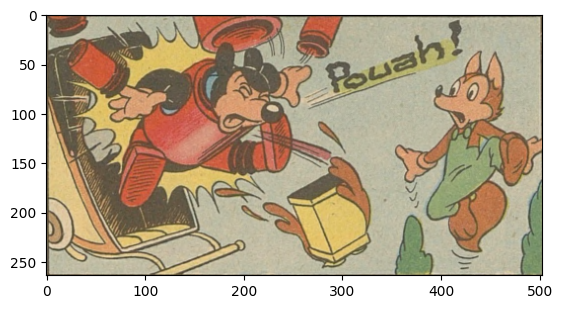

In [58]:
plt.imshow(im)

Panoptic segmentation (top), instance segmentation (middle), semantic segmentation (bottom)


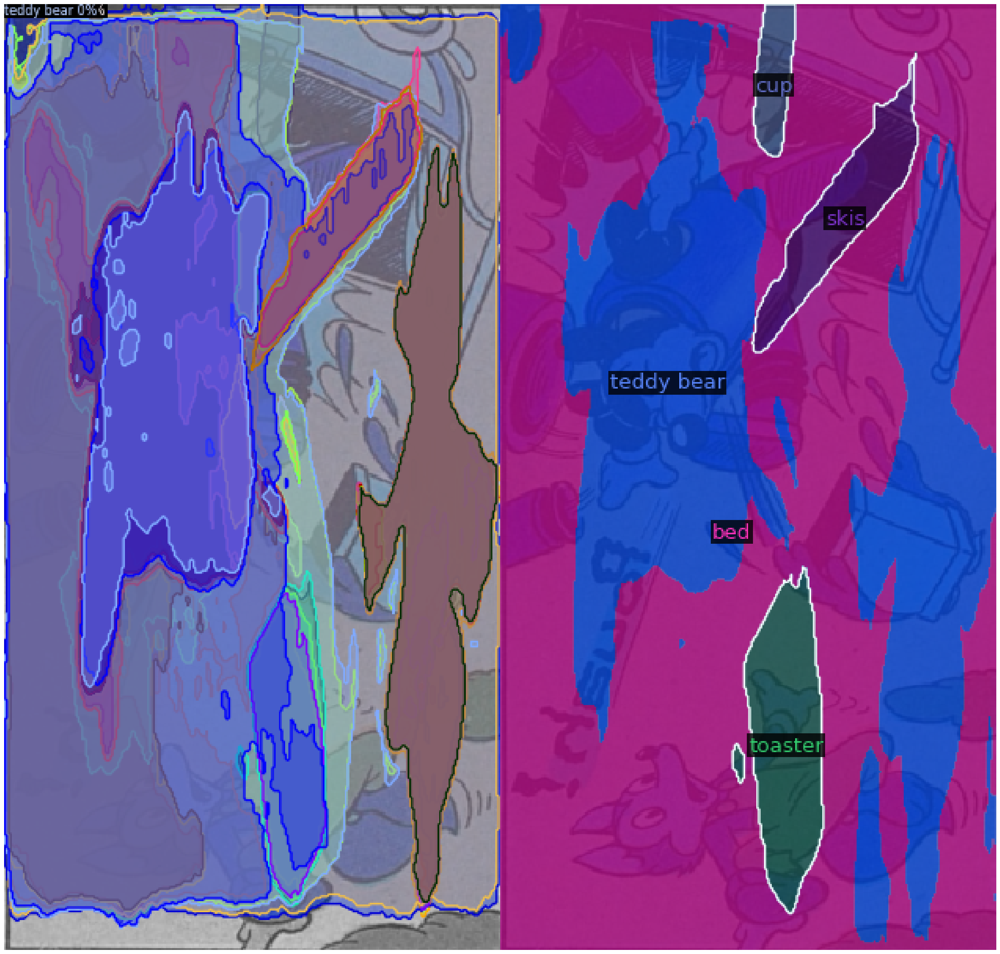

In [59]:
from src.dataset.helpers import *
im = panel['image'].cpu().numpy().transpose(2, 1, 0)

v = Visualizer(im, coco_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
instance_result = v.draw_instance_predictions(outputs["instances"].to("cpu")).get_image()
v = Visualizer(im, coco_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
semantic_result = v.draw_sem_seg(outputs["sem_seg"].argmax(0).to("cpu")).get_image()
print("Panoptic segmentation (top), instance segmentation (middle), semantic segmentation (bottom)")
res = np.concatenate((instance_result, semantic_result), axis=1)[:, :, ::-1]
plt.figure(figsize=(40, 30))
plt.imshow(res)
plt.axis('off')
plt.show()

In [36]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = ComicTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[09/05 18:38:29 d2.engine.defaults]: Model:
MaskFormer(
  (backbone): D2SwinTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 192, kernel_size=(4, 4), stride=(4, 4))
      (norm): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (layers): ModuleList(
      (0): BasicLayer(
        (blocks): ModuleList(
          (0): SwinTransformerBlock(
            (norm1): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
            (attn): WindowAttention(
              (qkv): Linear(in_features=192, out_features=576, bias=True)
              (attn_drop): Dropout(p=0.0, inplace=False)
              (proj): Linear(in_features=192, out_features=192, bias=True)
              (proj_drop): Dropout(p=0.0, inplace=False)
              (softmax): Softmax(dim=-1)
            )
            (drop_path): Identity()
            (norm2): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
            (mlp): Mlp(
              (

Skip loading parameter 'sem_seg_head.predictor.class_embed.weight' to the model due to incompatible shapes: (81, 256) in the checkpoint but (29, 256) in the model! You might want to double check if this is expected.
Skip loading parameter 'sem_seg_head.predictor.class_embed.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (29,) in the model! You might want to double check if this is expected.
Skip loading parameter 'criterion.empty_weight' to the model due to incompatible shapes: (81,) in the checkpoint but (29,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
criterion.empty_weight
sem_seg_head.predictor.class_embed.{bias, weight}


[09/05 18:38:34 d2.engine.train_loop]: Starting training from iteration 1
[09/05 18:38:45 d2.utils.events]:  eta: 3 days, 5:35:47  iter: 19  total_loss: 101.5  loss_ce: 6.682  loss_mask: 0.08776  loss_dice: 3.831  loss_ce_0: 6.462  loss_mask_0: 0.005443  loss_dice_0: 0.6739  loss_ce_1: 6.677  loss_mask_1: 0.006303  loss_dice_1: 1.268  loss_ce_2: 6.995  loss_mask_2: 0.02568  loss_dice_2: 2.924  loss_ce_3: 7.048  loss_mask_3: 0.07847  loss_dice_3: 3.555  loss_ce_4: 7.106  loss_mask_4: 0.08553  loss_dice_4: 3.748  loss_ce_5: 6.933  loss_mask_5: 0.09168  loss_dice_5: 4.007  loss_ce_6: 7.387  loss_mask_6: 0.1137  loss_dice_6: 3.995  loss_ce_7: 7.108  loss_mask_7: 0.1019  loss_dice_7: 3.708  loss_ce_8: 6.595  loss_mask_8: 0.08107  loss_dice_8: 3.724    time: 0.4130  last_time: 0.3327  data_time: 0.0830  last_data_time: 0.0035   lr: 1e-05  max_mem: 13854M


2023-09-05 18:38:45.479391: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-05 18:38:45.969706: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


[09/05 18:38:57 d2.utils.events]:  eta: 3 days, 5:35:40  iter: 39  total_loss: 99.43  loss_ce: 6.67  loss_mask: 0.08591  loss_dice: 3.764  loss_ce_0: 6.367  loss_mask_0: 0.003333  loss_dice_0: 0.6451  loss_ce_1: 6.594  loss_mask_1: 0.005768  loss_dice_1: 1.222  loss_ce_2: 6.954  loss_mask_2: 0.02106  loss_dice_2: 2.735  loss_ce_3: 7.034  loss_mask_3: 0.08342  loss_dice_3: 3.352  loss_ce_4: 7.035  loss_mask_4: 0.08201  loss_dice_4: 3.796  loss_ce_5: 7.047  loss_mask_5: 0.09086  loss_dice_5: 3.84  loss_ce_6: 7.392  loss_mask_6: 0.1109  loss_dice_6: 3.843  loss_ce_7: 7.227  loss_mask_7: 0.09677  loss_dice_7: 3.665  loss_ce_8: 6.634  loss_mask_8: 0.09329  loss_dice_8: 3.734    time: 0.4485  last_time: 0.4097  data_time: 0.0034  last_data_time: 0.0032   lr: 1e-05  max_mem: 19908M
[09/05 18:39:06 d2.utils.events]:  eta: 3 days, 5:35:32  iter: 59  total_loss: 99.58  loss_ce: 6.632  loss_mask: 0.08081  loss_dice: 3.718  loss_ce_0: 6.476  loss_mask_0: 0.005365  loss_dice_0: 0.7863  loss_ce_1: 6

OutOfMemoryError: CUDA out of memory. Tried to allocate 822.00 MiB (GPU 0; 23.68 GiB total capacity; 20.98 GiB already allocated; 636.12 MiB free; 22.29 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [30]:
torch.cuda.empty_cache()